In [1]:
import os
import sys
import itertools
import math
import logging
import json
import re
import random
from collections import OrderedDict
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.lines as lines
from matplotlib.patches import Polygon

In [2]:
ROOT_DIR = os.path.abspath(os.getcwd())

In [3]:
# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log

In [4]:
import balloon

In [5]:
%matplotlib inline

In [6]:
config = balloon.BalloonConfig()
BALLOON_DIR = os.path.join(ROOT_DIR, "balloon_dataset")

In [7]:
# Load dataset
# Get the dataset from the releases page
# https://github.com/matterport/Mask_RCNN/releases
dataset = balloon.BalloonDataset()
dataset.load_balloon(BALLOON_DIR, "train")

# Must call before using the dataset
dataset.prepare()

print("Image Count: {}".format(len(dataset.image_ids)))
print("Class Count: {}".format(dataset.num_classes))
for i, info in enumerate(dataset.class_info):
    print("{:3}. {:50}".format(i, info['name']))

Image Count: 61
Class Count: 2
  0. BG                                                
  1. balloon                                           


mask.shape, min(mask),max(mask): (683, 1024, 2), 0,0
rr.shape, min(rr),max(rr): (201064,), 14,520
cc.shape, min(cc),max(cc): (201064,), 466,974
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (201064,), 14,520
cc.shape, min(cc),max(cc): (201064,), 466,974
mask.shape, min(mask),max(mask): (683, 1024, 2), 0,1
rr.shape, min(rr),max(rr): (114104,), 303,677
cc.shape, min(cc),max(cc): (114104,), 158,577
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (114104,), 303,677
cc.shape, min(cc),max(cc): (114104,), 158,577


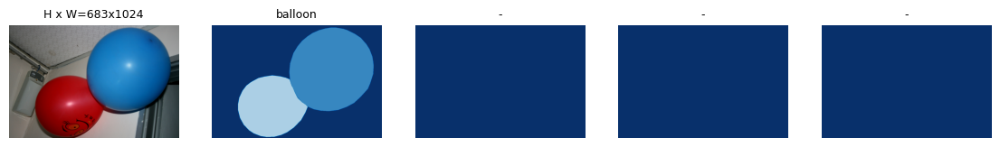

mask.shape, min(mask),max(mask): (768, 1024, 1), 0,0
rr.shape, min(rr),max(rr): (7764,), 380,477
cc.shape, min(cc),max(cc): (7764,), 625,724
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (7764,), 380,477
cc.shape, min(cc),max(cc): (7764,), 625,724


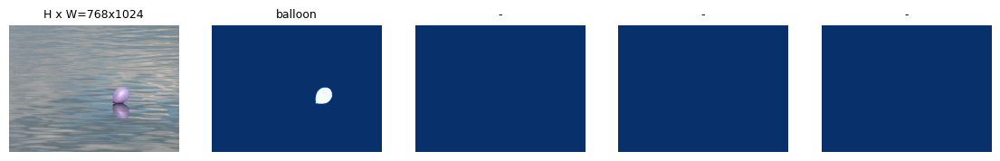

mask.shape, min(mask),max(mask): (856, 1024, 1), 0,0
rr.shape, min(rr),max(rr): (7334,), 18,129
cc.shape, min(cc),max(cc): (7334,), 553,643
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (7334,), 18,129
cc.shape, min(cc),max(cc): (7334,), 553,643


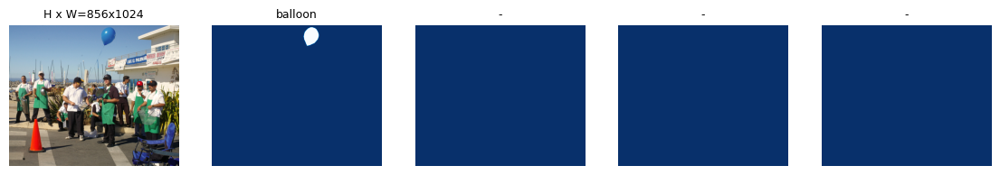

mask.shape, min(mask),max(mask): (679, 1024, 28), 0,0
rr.shape, min(rr),max(rr): (27118,), 218,433
cc.shape, min(cc),max(cc): (27118,), 600,777
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (27118,), 218,433
cc.shape, min(cc),max(cc): (27118,), 600,777
mask.shape, min(mask),max(mask): (679, 1024, 28), 0,1
rr.shape, min(rr),max(rr): (23208,), 81,272
cc.shape, min(cc),max(cc): (23208,), 66,237
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (23208,), 81,272
cc.shape, min(cc),max(cc): (23208,), 66,237
mask.shape, min(mask),max(mask): (679, 1024, 28), 0,1
rr.shape, min(rr),max(rr): (13920,), 246,377
cc.shape, min(cc),max(cc): (13920,), 154,332
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (13920,), 246,377
cc.shape, min(cc),max(cc): (13920,), 154,332
mask.shape, min(mask),max(mask): (679, 1024, 28), 0,1
rr.shape, min(rr),max(rr): (16309,), 56,230
cc.shape, min(cc),max(cc): (16309,), 228,372
After fixing the dirt mask, new values:

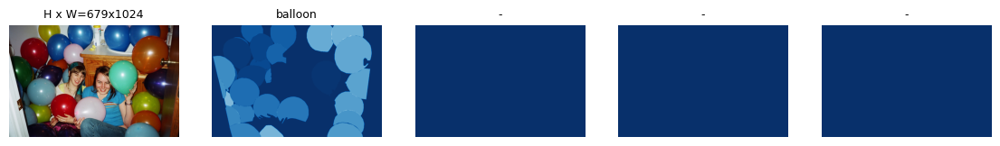

In [8]:
# Load and display random samples
image_ids = np.random.choice(dataset.image_ids, 4)
for image_id in image_ids:
    image = dataset.load_image(image_id)
    mask, class_ids = dataset.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset.class_names)

mask.shape, min(mask),max(mask): (768, 1024, 3), 0,0
rr.shape, min(rr),max(rr): (68084,), 272,563
cc.shape, min(cc),max(cc): (68084,), 463,759
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (68084,), 272,563
cc.shape, min(cc),max(cc): (68084,), 463,759
mask.shape, min(mask),max(mask): (768, 1024, 3), 0,1
rr.shape, min(rr),max(rr): (38503,), 138,391
cc.shape, min(cc),max(cc): (38503,), 394,679
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (38503,), 138,391
cc.shape, min(cc),max(cc): (38503,), 394,679
mask.shape, min(mask),max(mask): (768, 1024, 3), 0,1
rr.shape, min(rr),max(rr): (94949,), 278,612
cc.shape, min(cc),max(cc): (94949,), 114,478
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (94949,), 278,612
cc.shape, min(cc),max(cc): (94949,), 114,478
image_id  54 D:\KULIAH\SKRIPSI\NOTEBOOK\Mask-R-CNN-using-Tensorflow2\balloon_dataset\train\321888854_3723b6f10b_b.jpg
image                    shape: (768, 1024, 3)        min:    0

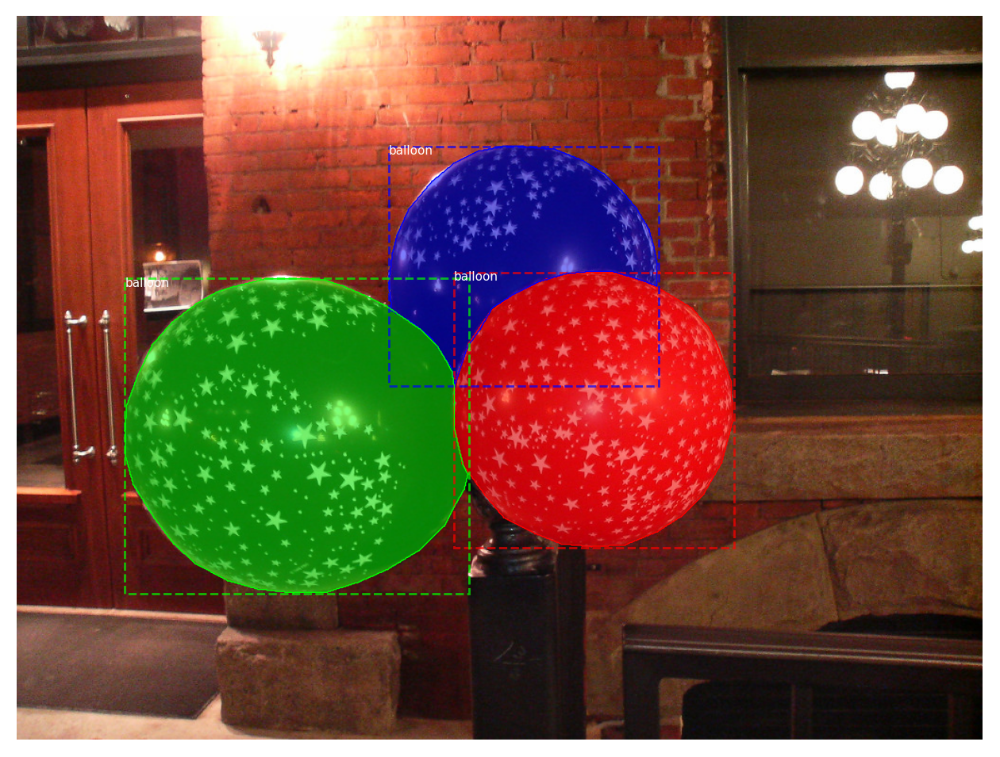

In [9]:
# Load random image and mask.
image_id = random.choice(dataset.image_ids)
image = dataset.load_image(image_id)
mask, class_ids = dataset.load_mask(image_id)
# Compute Bounding box
bbox = utils.extract_bboxes(mask)

# Display image and additional stats
print("image_id ", image_id, dataset.image_reference(image_id))
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)
# Display image and instances
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

mask.shape, min(mask),max(mask): (1024, 818, 2), 0,0
rr.shape, min(rr),max(rr): (6992,), 29,124
cc.shape, min(cc),max(cc): (6992,), 233,328
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (6992,), 29,124
cc.shape, min(cc),max(cc): (6992,), 233,328
mask.shape, min(mask),max(mask): (1024, 818, 2), 0,1
rr.shape, min(rr),max(rr): (7409,), 28,124
cc.shape, min(cc),max(cc): (7409,), 352,449
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (7409,), 28,124
cc.shape, min(cc),max(cc): (7409,), 352,449
image_id:  25 D:\KULIAH\SKRIPSI\NOTEBOOK\Mask-R-CNN-using-Tensorflow2\balloon_dataset\train\5674044810_2d9e2243ff_b.jpg
Original shape:  (1024, 818, 3)
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
mask                     shape: (1024, 1024, 2)       min:    0.00000  max:    1.00000  bool
class_ids                shape: (2,)                  min:    1.00000  max:    1.00000  int32
bbox                     shape: (

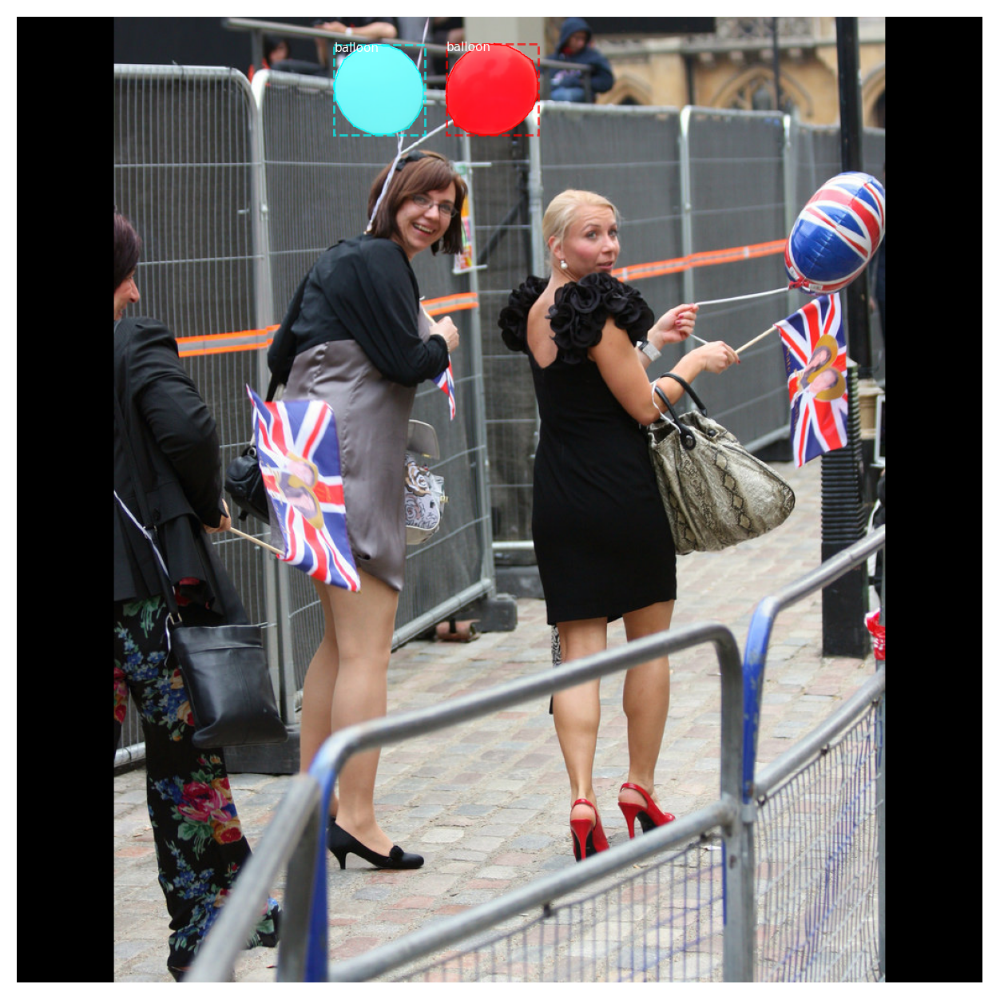

In [10]:
# Load random image and mask.
image_id = np.random.choice(dataset.image_ids, 1)[0]
image = dataset.load_image(image_id)
mask, class_ids = dataset.load_mask(image_id)
original_shape = image.shape
# Resize
image, window, scale, padding, _ = utils.resize_image(
    image, 
    min_dim=config.IMAGE_MIN_DIM, 
    max_dim=config.IMAGE_MAX_DIM,
    mode=config.IMAGE_RESIZE_MODE)
mask = utils.resize_mask(mask, scale, padding)
# Compute Bounding box
bbox = utils.extract_bboxes(mask)

# Display image and additional stats
print("image_id: ", image_id, dataset.image_reference(image_id))
print("Original shape: ", original_shape)
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)
# Display image and instances
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

mask.shape, min(mask),max(mask): (1024, 768, 4), 0,0
rr.shape, min(rr),max(rr): (39301,), 358,632
cc.shape, min(cc),max(cc): (39301,), 471,671
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (39301,), 358,632
cc.shape, min(cc),max(cc): (39301,), 471,671
mask.shape, min(mask),max(mask): (1024, 768, 4), 0,1
rr.shape, min(rr),max(rr): (30888,), 456,681
cc.shape, min(cc),max(cc): (30888,), 318,503
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (30888,), 456,681
cc.shape, min(cc),max(cc): (30888,), 318,503
mask.shape, min(mask),max(mask): (1024, 768, 4), 0,1
rr.shape, min(rr),max(rr): (17035,), 569,730
cc.shape, min(cc),max(cc): (17035,), 224,378
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (17035,), 569,730
cc.shape, min(cc),max(cc): (17035,), 224,378
mask.shape, min(mask),max(mask): (1024, 768, 4), 0,1
rr.shape, min(rr),max(rr): (33009,), 713,937
cc.shape, min(cc),max(cc): (33009,), 209,398
After fixing the dirt mask, new values

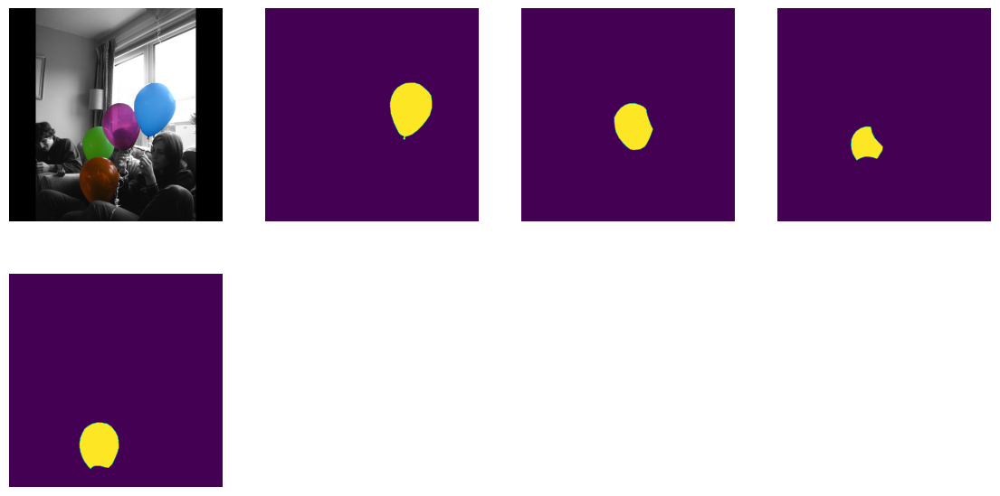

In [11]:
image_id = np.random.choice(dataset.image_ids, 1)[0]
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    dataset, config, image_id)

log("image", image)
log("image_meta", image_meta)
log("class_ids", class_ids)
log("bbox", bbox)
log("mask", mask)

display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

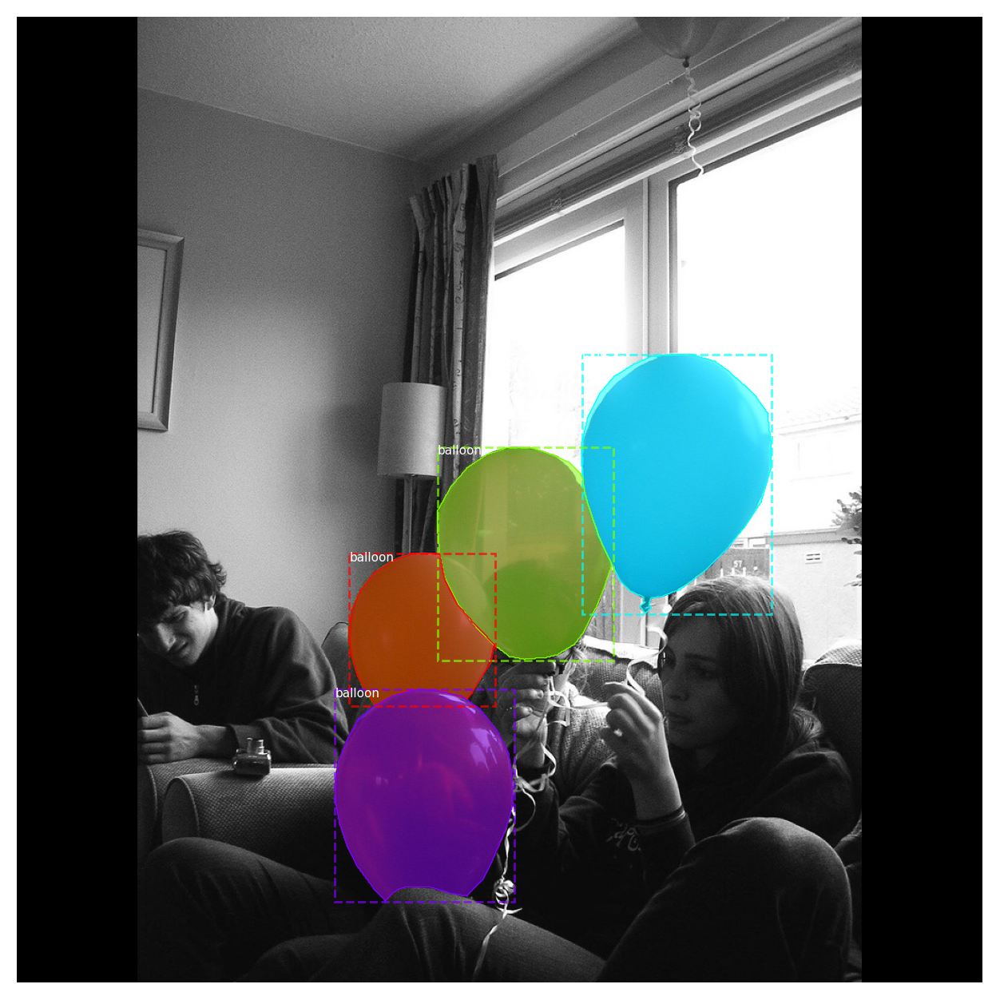

In [12]:
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

mask.shape, min(mask),max(mask): (1024, 768, 4), 0,0
rr.shape, min(rr),max(rr): (39301,), 358,632
cc.shape, min(cc),max(cc): (39301,), 471,671
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (39301,), 358,632
cc.shape, min(cc),max(cc): (39301,), 471,671
mask.shape, min(mask),max(mask): (1024, 768, 4), 0,1
rr.shape, min(rr),max(rr): (30888,), 456,681
cc.shape, min(cc),max(cc): (30888,), 318,503
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (30888,), 456,681
cc.shape, min(cc),max(cc): (30888,), 318,503
mask.shape, min(mask),max(mask): (1024, 768, 4), 0,1
rr.shape, min(rr),max(rr): (17035,), 569,730
cc.shape, min(cc),max(cc): (17035,), 224,378
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (17035,), 569,730
cc.shape, min(cc),max(cc): (17035,), 224,378
mask.shape, min(mask),max(mask): (1024, 768, 4), 0,1
rr.shape, min(rr),max(rr): (33009,), 713,937
cc.shape, min(cc),max(cc): (33009,), 209,398
After fixing the dirt mask, new values

mask                     shape: (56, 56, 4)           min:    0.00000  max:    1.00000  bool


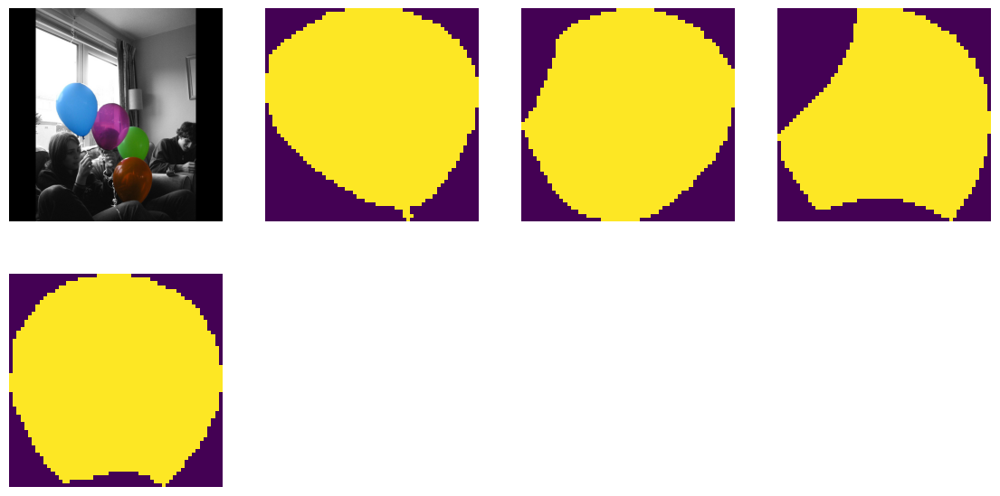

In [13]:
# Add augmentation and mask resizing.
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    dataset, config, image_id, augment=True, use_mini_mask=True)
log("mask", mask)
display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

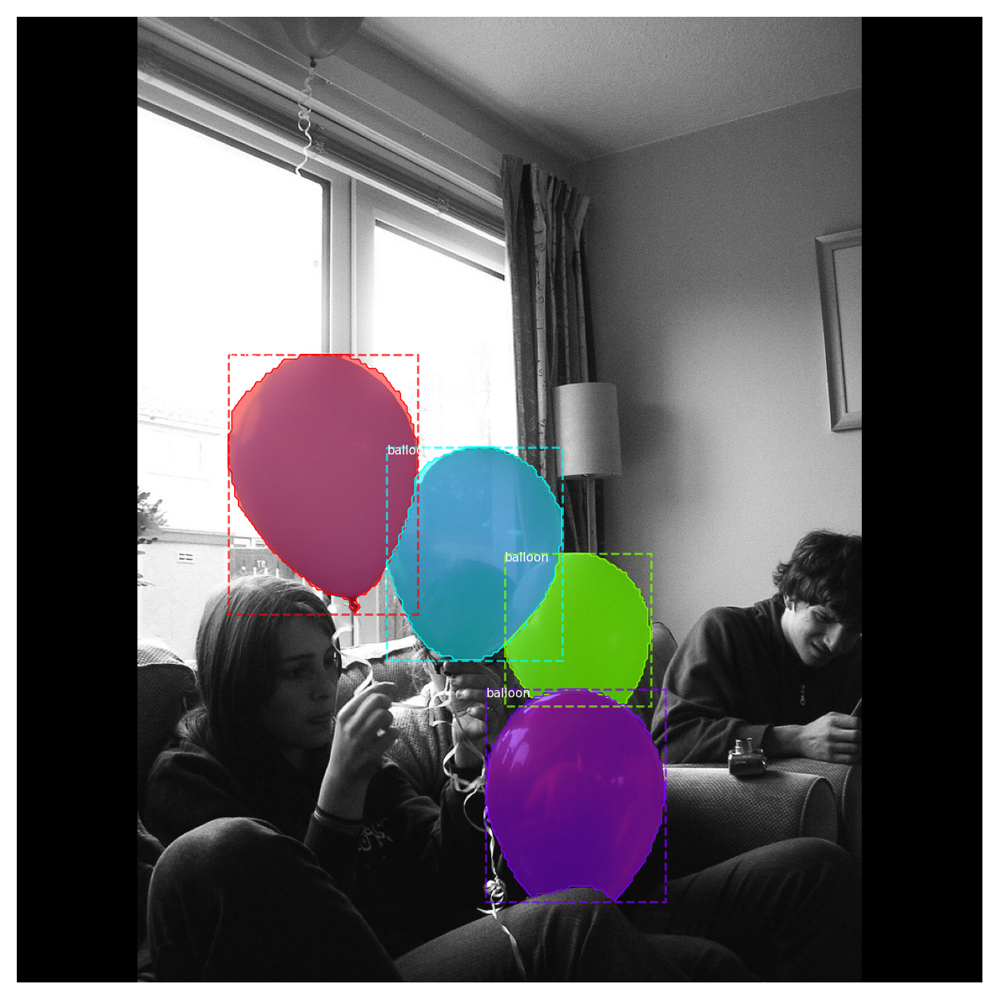

In [14]:
mask = utils.expand_mask(bbox, mask, image.shape)
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

In [15]:
# Generate Anchors
backbone_shapes = modellib.compute_backbone_shapes(config, config.IMAGE_SHAPE)
anchors = utils.generate_pyramid_anchors(config.RPN_ANCHOR_SCALES, 
                                          config.RPN_ANCHOR_RATIOS,
                                          backbone_shapes,
                                          config.BACKBONE_STRIDES, 
                                          config.RPN_ANCHOR_STRIDE)

# Print summary of anchors
num_levels = len(backbone_shapes)
anchors_per_cell = len(config.RPN_ANCHOR_RATIOS)
print("Count: ", anchors.shape[0])
print("Scales: ", config.RPN_ANCHOR_SCALES)
print("ratios: ", config.RPN_ANCHOR_RATIOS)
print("Anchors per Cell: ", anchors_per_cell)
print("Levels: ", num_levels)
anchors_per_level = []
for l in range(num_levels):
    num_cells = backbone_shapes[l][0] * backbone_shapes[l][1]
    anchors_per_level.append(anchors_per_cell * num_cells // config.RPN_ANCHOR_STRIDE**2)
    print("Anchors in Level {}: {}".format(l, anchors_per_level[l]))

Count:  261888
Scales:  (32, 64, 128, 256, 512)
ratios:  [0.5, 1, 2]
Anchors per Cell:  3
Levels:  5
Anchors in Level 0: 196608
Anchors in Level 1: 49152
Anchors in Level 2: 12288
Anchors in Level 3: 3072
Anchors in Level 4: 768


mask.shape, min(mask),max(mask): (768, 1024, 5), 0,0
rr.shape, min(rr),max(rr): (37618,), 0,253
cc.shape, min(cc),max(cc): (37618,), 195,401
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (37618,), 0,253
cc.shape, min(cc),max(cc): (37618,), 195,401
mask.shape, min(mask),max(mask): (768, 1024, 5), 0,1
rr.shape, min(rr),max(rr): (21257,), 30,245
cc.shape, min(cc),max(cc): (21257,), 87,246
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (21257,), 30,245
cc.shape, min(cc),max(cc): (21257,), 87,246
mask.shape, min(mask),max(mask): (768, 1024, 5), 0,1
rr.shape, min(rr),max(rr): (4911,), 0,81
cc.shape, min(cc),max(cc): (4911,), 484,563
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (4911,), 0,81
cc.shape, min(cc),max(cc): (4911,), 484,563
mask.shape, min(mask),max(mask): (768, 1024, 5), 0,1
rr.shape, min(rr),max(rr): (2703,), 0,71
cc.shape, min(cc),max(cc): (2703,), 425,490
After fixing the dirt mask, new values:
rr.shape, min(rr),max

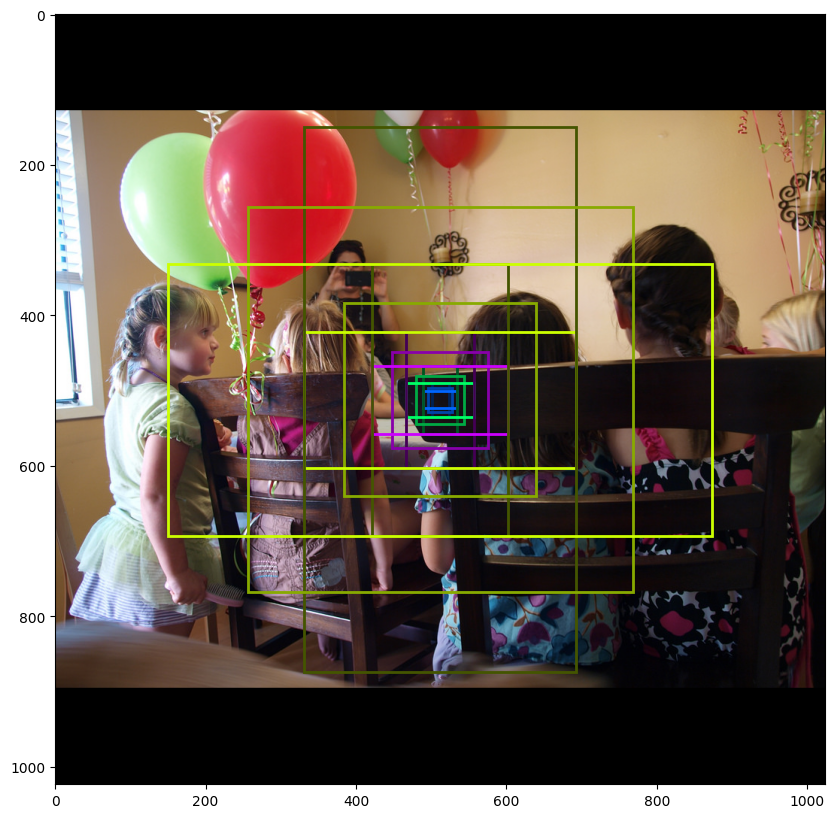

In [16]:
## Visualize anchors of one cell at the center of the feature map of a specific level

# Load and draw random image
image_id = np.random.choice(dataset.image_ids, 1)[0]
image, image_meta, _, _, _ = modellib.load_image_gt(dataset, config, image_id)
fig, ax = plt.subplots(1, figsize=(10, 10))
ax.imshow(image)
levels = len(backbone_shapes)

for level in range(levels):
    colors = visualize.random_colors(levels)
    # Compute the index of the anchors at the center of the image
    level_start = sum(anchors_per_level[:level]) # sum of anchors of previous levels
    level_anchors = anchors[level_start:level_start+anchors_per_level[level]]
    print("Level {}. Anchors: {:6}  Feature map Shape: {}".format(level, level_anchors.shape[0], 
                                                                  backbone_shapes[level]))
    center_cell = backbone_shapes[level] // 2
    center_cell_index = (center_cell[0] * backbone_shapes[level][1] + center_cell[1])
    level_center = center_cell_index * anchors_per_cell 
    center_anchor = anchors_per_cell * (
        (center_cell[0] * backbone_shapes[level][1] / config.RPN_ANCHOR_STRIDE**2) \
        + center_cell[1] / config.RPN_ANCHOR_STRIDE)
    level_center = int(center_anchor)

    # Draw anchors. Brightness show the order in the array, dark to bright.
    for i, rect in enumerate(level_anchors[level_center:level_center+anchors_per_cell]):
        y1, x1, y2, x2 = rect
        p = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, facecolor='none',
                              edgecolor=(i+1)*np.array(colors[level]) / anchors_per_cell)
        ax.add_patch(p)


In [17]:
# Create data generator
random_rois = 2000
g = modellib.data_generator(
    dataset, config, shuffle=True, random_rois=random_rois, 
    batch_size=4,
    detection_targets=True)

In [18]:
# Uncomment to run the generator through a lot of images
# to catch rare errors
# for i in range(1000):
#     print(i)
#     _, _ = next(g)

In [19]:
# Get Next Image
if random_rois:
    [normalized_images, image_meta, rpn_match, rpn_bbox, gt_class_ids, gt_boxes, gt_masks, rpn_rois, rois], \
    [mrcnn_class_ids, mrcnn_bbox, mrcnn_mask] = next(g)
    
    log("rois", rois)
    log("mrcnn_class_ids", mrcnn_class_ids)
    log("mrcnn_bbox", mrcnn_bbox)
    log("mrcnn_mask", mrcnn_mask)
else:
    [normalized_images, image_meta, rpn_match, rpn_bbox, gt_boxes, gt_masks], _ = next(g)
    
log("gt_class_ids", gt_class_ids)
log("gt_boxes", gt_boxes)
log("gt_masks", gt_masks)
log("rpn_match", rpn_match, )
log("rpn_bbox", rpn_bbox)
image_id = modellib.parse_image_meta(image_meta)["image_id"][0]
print("image_id: ", image_id, dataset.image_reference(image_id))

# Remove the last dim in mrcnn_class_ids. It's only added
# to satisfy Keras restriction on target shape.
mrcnn_class_ids = mrcnn_class_ids[:,:,0]

mask.shape, min(mask),max(mask): (803, 1024, 16), 0,0
rr.shape, min(rr),max(rr): (7345,), 102,191
cc.shape, min(cc),max(cc): (7345,), 678,793
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (7345,), 102,191
cc.shape, min(cc),max(cc): (7345,), 678,793
mask.shape, min(mask),max(mask): (803, 1024, 16), 0,1
rr.shape, min(rr),max(rr): (4751,), 180,258
cc.shape, min(cc),max(cc): (4751,), 720,799
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (4751,), 180,258
cc.shape, min(cc),max(cc): (4751,), 720,799
mask.shape, min(mask),max(mask): (803, 1024, 16), 0,1
rr.shape, min(rr),max(rr): (5793,), 166,246
cc.shape, min(cc),max(cc): (5793,), 629,723
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (5793,), 166,246
cc.shape, min(cc),max(cc): (5793,), 629,723
mask.shape, min(mask),max(mask): (803, 1024, 16), 0,1
rr.shape, min(rr),max(rr): (3721,), 131,189
cc.shape, min(cc),max(cc): (3721,), 578,686
After fixing the dirt mask, new values:
rr.shape

anchors                  shape: (261888, 4)           min: -362.03867  max: 1322.03867  float64
refined_anchors          shape: (99, 4)               min:  212.00000  max:  800.00000  float32
Positive anchors: 99
Negative anchors: 157
Neutral anchors: 261632
BG                     : 135
balloon                : 65


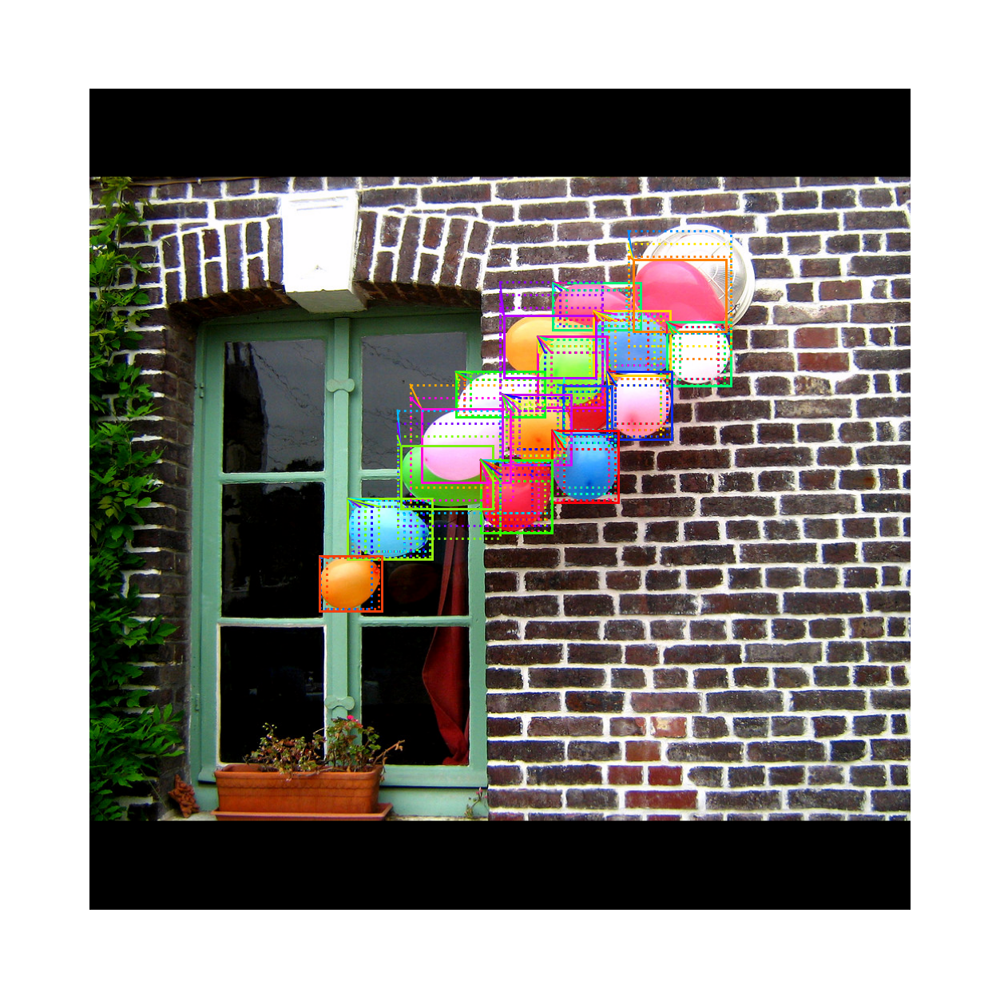

In [20]:
b = 0

# Restore original image (reverse normalization)
sample_image = modellib.unmold_image(normalized_images[b], config)

# Compute anchor shifts.
indices = np.where(rpn_match[b] == 1)[0]
refined_anchors = utils.apply_box_deltas(anchors[indices], rpn_bbox[b, :len(indices)] * config.RPN_BBOX_STD_DEV)
log("anchors", anchors)
log("refined_anchors", refined_anchors)

# Get list of positive anchors
positive_anchor_ids = np.where(rpn_match[b] == 1)[0]
print("Positive anchors: {}".format(len(positive_anchor_ids)))
negative_anchor_ids = np.where(rpn_match[b] == -1)[0]
print("Negative anchors: {}".format(len(negative_anchor_ids)))
neutral_anchor_ids = np.where(rpn_match[b] == 0)[0]
print("Neutral anchors: {}".format(len(neutral_anchor_ids)))

# ROI breakdown by class
for c, n in zip(dataset.class_names, np.bincount(mrcnn_class_ids[b].flatten())):
    if n:
        print("{:23}: {}".format(c[:20], n))

# Show positive anchors
fig, ax = plt.subplots(1, figsize=(16, 16))
visualize.draw_boxes(sample_image, boxes=anchors[positive_anchor_ids], 
                     refined_boxes=refined_anchors, ax=ax)

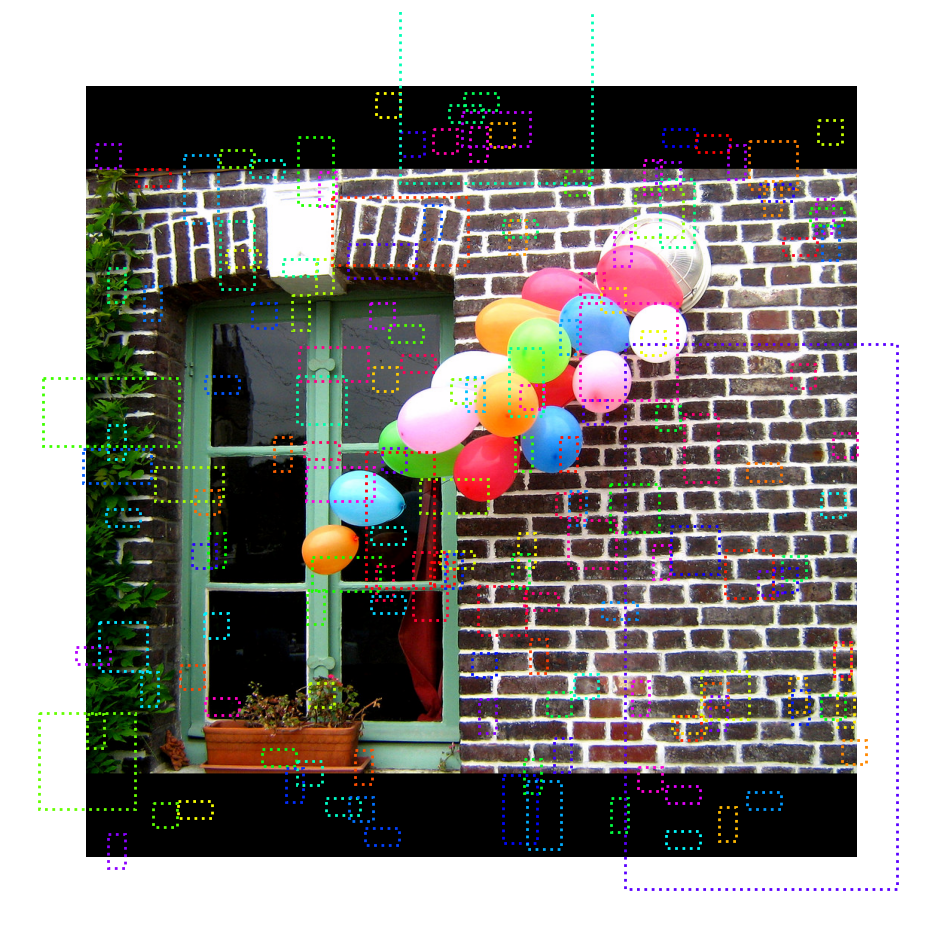

In [21]:
# Show negative anchors
visualize.draw_boxes(sample_image, boxes=anchors[negative_anchor_ids])

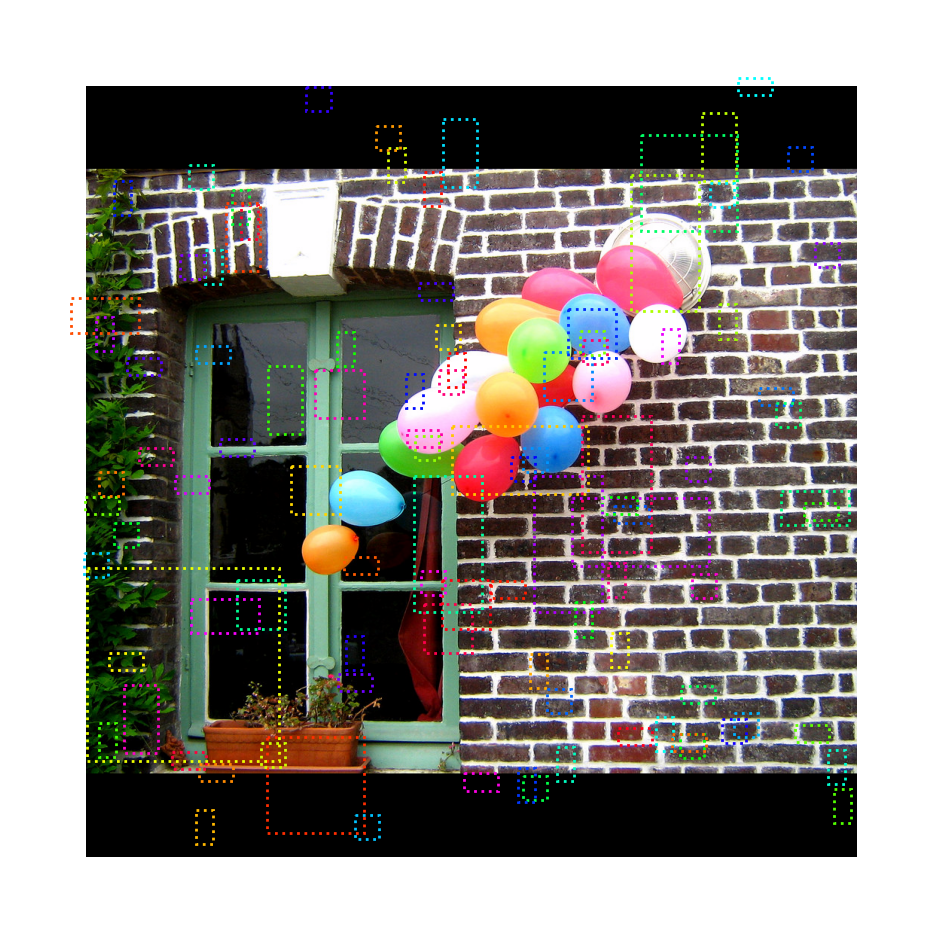

In [22]:
# Show neutral anchors. They don't contribute to training.
visualize.draw_boxes(sample_image, boxes=anchors[np.random.choice(neutral_anchor_ids, 100)])

Positive ROIs:  65
Negative ROIs:  135
Positive Ratio: 0.33
Unique ROIs: 200 out of 200


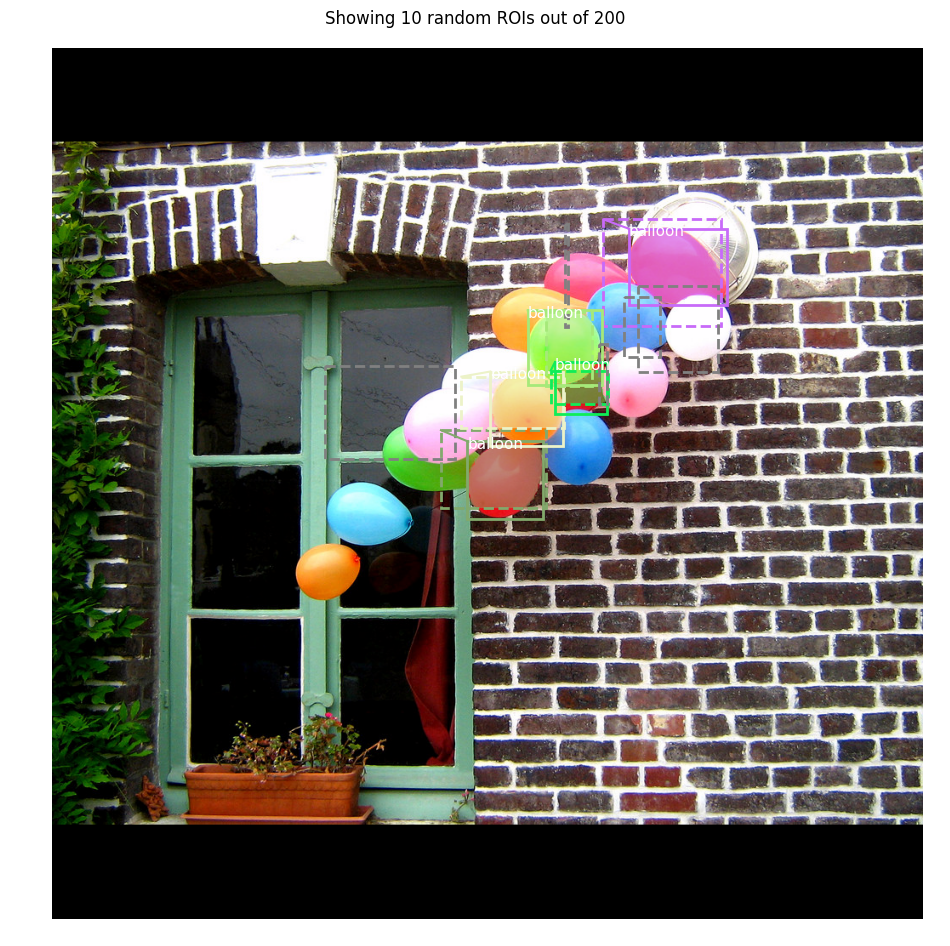

In [23]:
if random_rois:
    # Class aware bboxes
    bbox_specific = mrcnn_bbox[b, np.arange(mrcnn_bbox.shape[1]), mrcnn_class_ids[b], :]

    # Refined ROIs
    refined_rois = utils.apply_box_deltas(rois[b].astype(np.float32), bbox_specific[:,:4] * config.BBOX_STD_DEV)

    # Class aware masks
    mask_specific = mrcnn_mask[b, np.arange(mrcnn_mask.shape[1]), :, :, mrcnn_class_ids[b]]

    visualize.draw_rois(sample_image, rois[b], refined_rois, mask_specific, mrcnn_class_ids[b], dataset.class_names)
    
    # Any repeated ROIs?
    rows = np.ascontiguousarray(rois[b]).view(np.dtype((np.void, rois.dtype.itemsize * rois.shape[-1])))
    _, idx = np.unique(rows, return_index=True)
    print("Unique ROIs: {} out of {}".format(len(idx), rois.shape[1]))

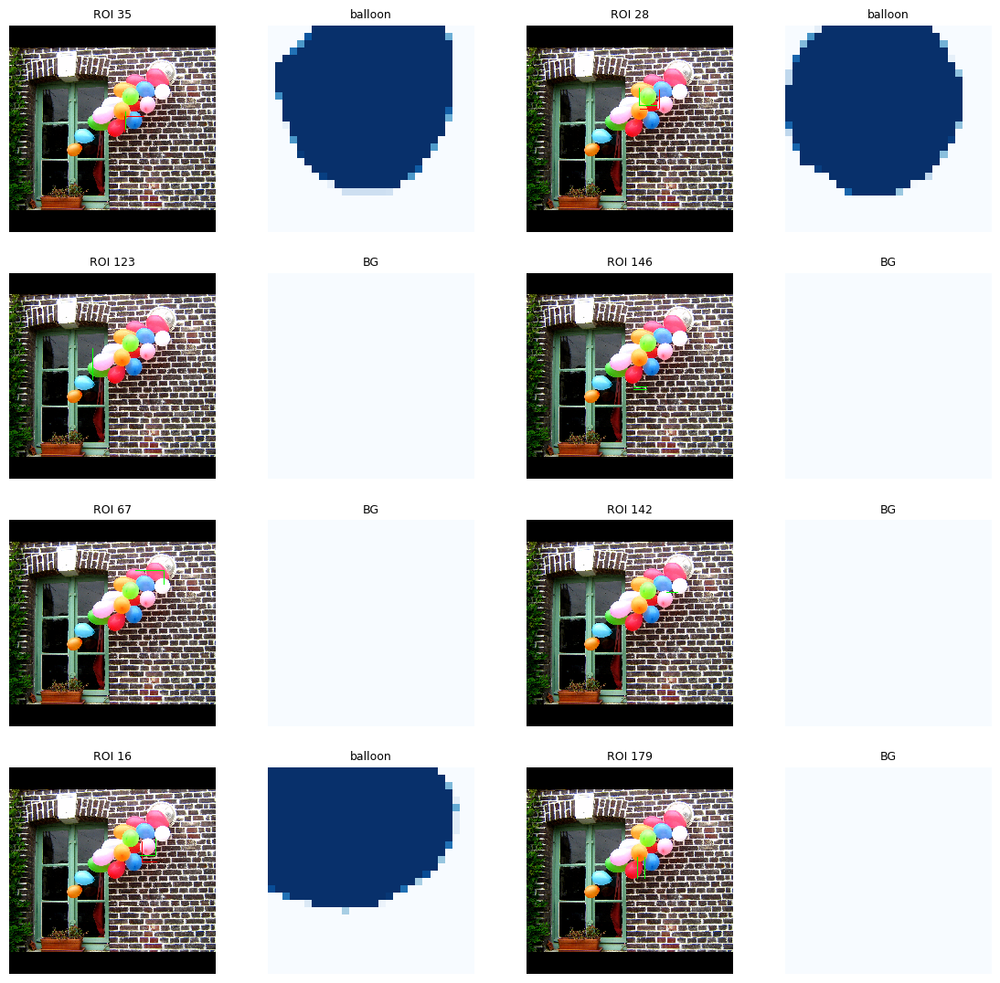

In [24]:
if random_rois:
    # Dispalay ROIs and corresponding masks and bounding boxes
    ids = random.sample(range(rois.shape[1]), 8)

    images = []
    titles = []
    for i in ids:
        image = visualize.draw_box(sample_image.copy(), rois[b,i,:4].astype(np.int32), [255, 0, 0])
        image = visualize.draw_box(image, refined_rois[i].astype(np.int64), [0, 255, 0])
        images.append(image)
        titles.append("ROI {}".format(i))
        images.append(mask_specific[i] * 255)
        titles.append(dataset.class_names[mrcnn_class_ids[b,i]][:20])

    display_images(images, titles, cols=4, cmap="Blues", interpolation="none")

In [25]:
# Check ratio of positive ROIs in a set of images.
if random_rois:
    limit = 10
    temp_g = modellib.data_generator(
        dataset, config, shuffle=True, random_rois=10000, 
        batch_size=1, detection_targets=True)
    total = 0
    for i in range(limit):
        _, [ids, _, _] = next(temp_g)
        positive_rois = np.sum(ids[0] > 0)
        total += positive_rois
        print("{:5} {:5.2f}".format(positive_rois, positive_rois/ids.shape[1]))
    print("Average percent: {:.2f}".format(total/(limit*ids.shape[1])))

mask.shape, min(mask),max(mask): (768, 1024, 11), 0,0
rr.shape, min(rr),max(rr): (1893,), 0,43
cc.shape, min(cc),max(cc): (1893,), 602,655
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (1893,), 0,43
cc.shape, min(cc),max(cc): (1893,), 602,655
mask.shape, min(mask),max(mask): (768, 1024, 11), 0,1
rr.shape, min(rr),max(rr): (3535,), 143,226
cc.shape, min(cc),max(cc): (3535,), 597,654
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (3535,), 143,226
cc.shape, min(cc),max(cc): (3535,), 597,654
mask.shape, min(mask),max(mask): (768, 1024, 11), 0,1
rr.shape, min(rr),max(rr): (6917,), 134,234
cc.shape, min(cc),max(cc): (6917,), 476,567
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (6917,), 134,234
cc.shape, min(cc),max(cc): (6917,), 476,567
mask.shape, min(mask),max(mask): (768, 1024, 11), 0,1
rr.shape, min(rr),max(rr): (3068,), 84,150
cc.shape, min(cc),max(cc): (3068,), 383,442
After fixing the dirt mask, new values:
rr.shape, min(r

   66  0.33
mask.shape, min(mask),max(mask): (1625, 2048, 2), 0,0
rr.shape, min(rr),max(rr): (286706,), 1,644
cc.shape, min(cc),max(cc): (286706,), 1347,1933
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (286706,), 1,644
cc.shape, min(cc),max(cc): (286706,), 1347,1933
mask.shape, min(mask),max(mask): (1625, 2048, 2), 0,1
rr.shape, min(rr),max(rr): (279760,), 557,1156
cc.shape, min(cc),max(cc): (279760,), 1397,1994
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (279760,), 557,1156
cc.shape, min(cc),max(cc): (279760,), 1397,1994
   66  0.33
mask.shape, min(mask),max(mask): (768, 1024, 3), 0,0
rr.shape, min(rr),max(rr): (7643,), 0,247
cc.shape, min(cc),max(cc): (7643,), 454,587
After fixing the dirt mask, new values:
rr.shape, min(rr),max(rr): (7643,), 0,247
cc.shape, min(cc),max(cc): (7643,), 454,587
mask.shape, min(mask),max(mask): (768, 1024, 3), 0,1
rr.shape, min(rr),max(rr): (31599,), 1,205
cc.shape, min(cc),max(cc): (31599,), 354,569
After fi